--- Day 3: Crossed Wires ---

The gravity assist was successful, and you're well on your way to the Venus refuelling station. During the rush back on Earth, the fuel management system wasn't completely installed, so that's next on the priority list.

Opening the front panel reveals a jumble of wires. Specifically, two wires are connected to a central port and extend outward on a grid. You trace the path each wire takes as it leaves the central port, one wire per line of text (your puzzle input).

The wires twist and turn, but the two wires occasionally cross paths. To fix the circuit, you need to find the intersection point closest to the central port. Because the wires are on a grid, use the Manhattan distance for this measurement. While the wires do technically cross right at the central port where they both start, this point does not count, nor does a wire count as crossing with itself.

For example, if the first wire's path is R8,U5,L5,D3, then starting from the central port (o), it goes right 8, up 5, left 5, and finally down 3:

...........
...........
...........
....+----+.
....|....|.
....|....|.
....|....|.
.........|.
.o-------+.
...........
Then, if the second wire's path is U7,R6,D4,L4, it goes up 7, right 6, down 4, and left 4:

...........
.+-----+...
.|.....|...
.|..+--X-+.
.|..|..|.|.
.|.-X--+.|.
.|..|....|.
.|.......|.
.o-------+.
...........
These wires cross at two locations (marked X), but the lower-left one is closer to the central port: its distance is 3 + 3 = 6.

Here are a few more examples:

R75,D30,R83,U83,L12,D49,R71,U7,L72
U62,R66,U55,R34,D71,R55,D58,R83 = distance 159
R98,U47,R26,D63,R33,U87,L62,D20,R33,U53,R51
U98,R91,D20,R16,D67,R40,U7,R15,U6,R7 = distance 135
What is the Manhattan distance from the central port to the closest intersection?

In [1]:
cmd(str) =(str[1],parse(Int,str[2:end]));

test1 = ["R75","D30","R83","U83","L12","D49","R71","U7","L72"]
cmd.(test1)

9-element Array{Tuple{Char,Int64},1}:
 ('R', 75)
 ('D', 30)
 ('R', 83)
 ('U', 83)
 ('L', 12)
 ('D', 49)
 ('R', 71)
 ('U', 7)
 ('L', 72)

In [2]:
# R8,U5,L5,D3
function process(p,dir,cnt,line)
    (x,y) = p
    if dir == 'R'
        for i ∈ x:x+cnt
            push!(line,(i,y))
        end
        return (x+cnt,y),line
    end
    if dir == 'U'
        for i ∈ y:y+cnt
            push!(line,(x,i))
        end
        return (x,y+cnt),line
    end
    if dir == 'L'
        for i ∈ x:-1:x-cnt
            push!(line,(i,y))
        end
        return (x-cnt,y),line
    end
    if dir == 'D'
        for i ∈ y:-1:y-cnt
            push!(line,(x,i))
        end
        return (x,y-cnt),line
    end
    (0,0), line
end
process((0,0),'D',3,[])

((0, -3), Any[(0, 0), (0, -1), (0, -2), (0, -3)])

In [3]:
p = (0,0)
line = [p]
function process_line(p,line,cmds)
    for (dir,cnt) ∈ cmds
        (p,line) = process(p,dir,cnt,line[1:end-1])
    end
    (p,line)    
end

process_line (generic function with 1 method)

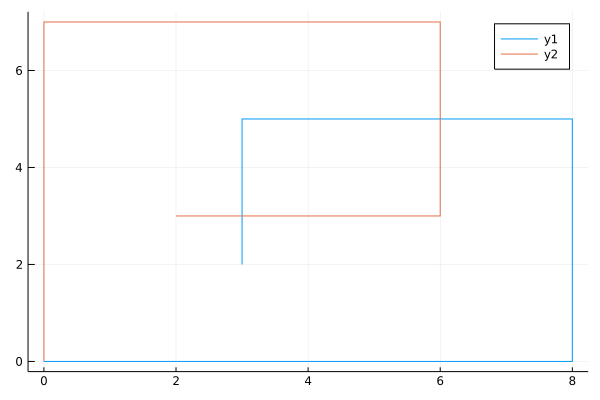

In [4]:
# R8,U5,L5,D3
using Plots
test = ["R8","U5","L5","D3"]
p = (0,0)
line = [p]
cmds = cmd.(test)

plot()
(p,line) = process_line(p,line,cmds)
plot!(line)


test = ["U7","R6","D4","L4"]
p = (0,0)
line = [p]
cmds = cmd.(test)

(p,line) = process_line(p,line,cmds)
plot!(line)



In [5]:
using DelimitedFiles
lines = readdlm("input.txt", ',',String)

2×301 Array{String,2}:
 "R999"   "D586"  "L462"  "D725"  "L236"  …  "U99"   "L43"   "D401"  "R19"
 "L1008"  "U23"   "L793"  "D944"  "L109"     "D674"  "R463"  "U238"  "R600"

In [6]:
using Plots
line1 = lines[1,:]
p = (0,0)
line = [p]
cmds = cmd.(line1)

plot()
(p,line) = process_line(p,line,cmds)
plot!(line)

line2 = lines[2,:]
p = (0,0)
line = [p]
cmds = cmd.(line2)

(p,line) = process_line(p,line,cmds)
plot!(line)

# part 1 solution

Achieved by zooming in to the graph.

In [7]:
using Plots
line1 = lines[1,:]
p = (0,0)
line = [p]
cmds = cmd.(line1)

plot(xlim=(180,185),ylim=(375,377))
(p,line) = process_line(p,line,cmds)
plot!(line)

line2 = lines[2,:]
p = (0,0)
line = [p]
cmds = cmd.(line2)

(p,line) = process_line(p,line,cmds)
plot!(line)

In [8]:
376+181

557

In [9]:
function process_line(cmds)
    p = (0,0)
    line = [(0,0)]
    for (dir,cnt) ∈ cmds
        (p,line) = process(p,dir,cnt,line[1:end-1])
    end
    line  
end;

Just processing data slighltly differently, examining how plots and arrays work..

In [10]:
a = cmd.(lines)
b = [a[1,:],a[2,:]]
c = process_line.(b)
plot(c[1])
plot!(c[2])




In [11]:
l1 = c[1]
l2 = c[2];

In [12]:
dict = Dict()
for i ∈ 1:length(l1)
    if get(dict,l1[i],-1) == -1
        dict[l1[i]] = i - 1 # 1-indexing
    end
end


In [13]:
dict2 = Dict()
for i ∈ 1:length(l2)
    if get(dict2,l2[i],-1) == -1
        dict2[l2[i]] = i - 1 # 1-indexing
    end
end

In [14]:
strengths = []
for (k,v) ∈ dict
    if get(dict2,k,-1) != -1
        if k!=(0,0)
          push!(strengths,dict[k]+dict2[k])
        end
    end
end
minimum(strengths)

56410